
<a name='toc'></a>  TOC

* <a href='#me.01.t1'> Modeling and Evaluation 1</a> :
            Train and adjust parameters  
            
  - <a href='#spectral'>SpectralClustering</a>
  - <a href='#end_of_file'> end of file</a>


In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib inline
import warnings
warnings.simplefilter('ignore',DeprecationWarning)
import seaborn as sns
import time
import copy

from pylab import rcParams
#import hdbscan

from sklearn.model_selection import ShuffleSplit
from sklearn.preprocessing import StandardScaler

#from sklearn.datasets import make_blobs

from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score

from sklearn import metrics
from sklearn import metrics as mt
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import confusion_matrix as conf
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score

from sklearn.cluster import KMeans

from tabulate import tabulate

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from __future__ import print_function

#### Read in cleaned  dataset from .csv file  

In [45]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in cleaned data set
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 'mashable_clean_dataset_for_lab_03.csv'

file_2_read = data_dir + data_file
df = pd.read_csv(file_2_read)

df_cluster = copy.deepcopy(df)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... add 'popular' binary based 'shares' values
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_cluster['shares'] = np.exp(df_cluster['ln_shares'])
df_cluster['popular'] = np.where(df_cluster['shares'] > 1400, 1, 0)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in t-SNE vectors
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 't_sne_mapping_perplex_0100.csv'

file_2_read = data_dir + data_file
df_tsne = pd.read_csv(file_2_read)

df_tsne.head()


# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... join t-sne vectors with base data, since we sampled to create
# ...     the t-sne mapping
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_join = df_tsne.join(df_cluster, on = 'sample_index')

df_join.head()


,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,global_subjectivity,global_rate_positive_words,rate_positive_words,...,ln_self_reference_avg_sharess,ln_LDA_00,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares
0,0.757447,-1.164821,0,1,0,-0.112902,0,0.670593,0.346403,0.457827,...,-0.139965,1.320242,1.235123,-0.643623,-0.631127,-0.692339,-0.266190,0.100486,0.248162,-1.171081
1,-0.661657,-1.688626,0,0,0,-0.112902,0,-0.875228,0.201534,0.269096,...,-2.032745,2.255159,-0.413498,-0.597044,-0.592009,-0.647786,-0.080881,-0.937038,-0.740381,-0.976042
2,-0.661657,-0.641015,0,0,0,-0.112902,0,2.218418,0.989601,0.920026,...,0.047434,0.248240,-0.510740,-0.674579,-0.666507,1.573640,-0.660825,0.100486,-0.740381,-0.173712
3,-0.661657,-0.117210,0,1,0,-0.112902,0,-0.115874,0.103648,-0.081405,...,-2.032745,-0.619381,1.412882,1.105693,-0.686387,-0.744975,0.386392,0.640207,-0.740381,-0.413529
4,1.230482,-0.117210,0,0,0,-0.112902,0,0.601046,2.008329,0.936179,...,0.423196,-0.619083,-0.537434,-0.696925,-0.687885,2.111239,-0.412983,-0.937038,-0.005038,-1.343719


,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,global_subjectivity,global_rate_positive_words,rate_positive_words,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,0.757447,-1.164821,0,1,0,-0.112902,0,0.670593,0.346403,0.457827,...,1.235123,-0.643623,-0.631127,-0.692339,-0.266190,0.100486,0.248162,-1.171081,0.310032,0
1,-0.661657,-1.688626,0,0,0,-0.112902,0,-0.875228,0.201534,0.269096,...,-0.413498,-0.597044,-0.592009,-0.647786,-0.080881,-0.937038,-0.740381,-0.976042,0.376799,0
2,-0.661657,-0.641015,0,0,0,-0.112902,0,2.218418,0.989601,0.920026,...,-0.510740,-0.674579,-0.666507,1.573640,-0.660825,0.100486,-0.740381,-0.173712,0.840539,0
3,-0.661657,-0.117210,0,1,0,-0.112902,0,-0.115874,0.103648,-0.081405,...,1.412882,1.105693,-0.686387,-0.744975,0.386392,0.640207,-0.740381,-0.413529,0.661312,0
4,1.230482,-0.117210,0,0,0,-0.112902,0,0.601046,2.008329,0.936179,...,-0.537434,-0.696925,-0.687885,2.111239,-0.412983,-0.937038,-0.005038,-1.343719,0.260874,0


,x-tsne,y-tsne,sample_index
0,13.380795,10.659998,6972
1,-9.200704,3.382056,11092
2,-29.567352,-1.899089,10229
3,-3.023949,21.598028,1319
4,-14.161682,-6.246559,29199


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,is_weekend,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,13.380795,10.659998,6972,-0.661657,-1.688626,0,1,0,-0.348014,0,...,2.852511,-0.597480,-0.591652,-0.647785,0.099159,0.100486,1.591996,-0.507042,0.602275,0
1,-9.200704,3.382056,11092,-2.080761,-0.641015,0,0,0,0.972211,0,...,-0.510734,-0.674533,-0.666230,-0.723204,-0.348173,-0.937038,-0.740381,0.736897,2.089441,0
2,-29.567352,-1.899089,10229,-0.188622,-0.641015,0,0,0,0.402518,1,...,2.428048,-0.674663,0.109347,-0.723205,-1.553284,-1.481184,0.543219,-1.131931,0.322410,0
3,-3.023949,21.598028,1319,0.757447,-1.688626,0,0,1,-1.646262,0,...,-0.407681,-0.595744,-0.591331,-0.637070,1.941572,-0.937038,-0.551762,1.368603,3.929857,0
4,-14.161682,-6.246559,29199,0.757447,0.406595,0,0,0,-0.369743,0,...,-0.559803,1.972443,-0.703975,-0.276279,-0.104558,0.100486,-0.740381,-0.247860,0.780469,0


<a href='#toc'> Table of Contents</a>

<a name='spectral'></a>
<font color="blue" size=3>Spectral

### spectral clustering


In [46]:
# set required variables for model comparison

spc_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit

models = []




### Spectral Clustering on the t-SNE 2-D mapping  



n_clusters =  2


/home/mcdevitt/anaconda3/lib/python3.6/site-packages/sklearn/manifold/spectral_embedding_.py:234: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

silhouette =  0.176732914578
n_clusters = 2


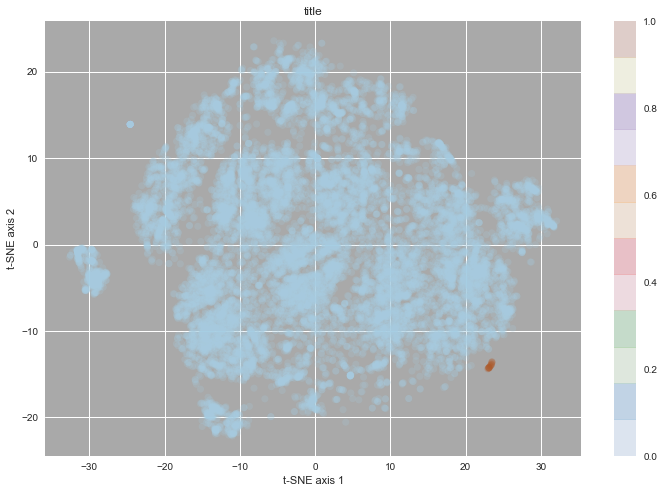

n_clusters =  3


array([0, 0, 2, ..., 0, 0, 0], dtype=int32)

silhouette =  0.0139641040795
n_clusters = 3


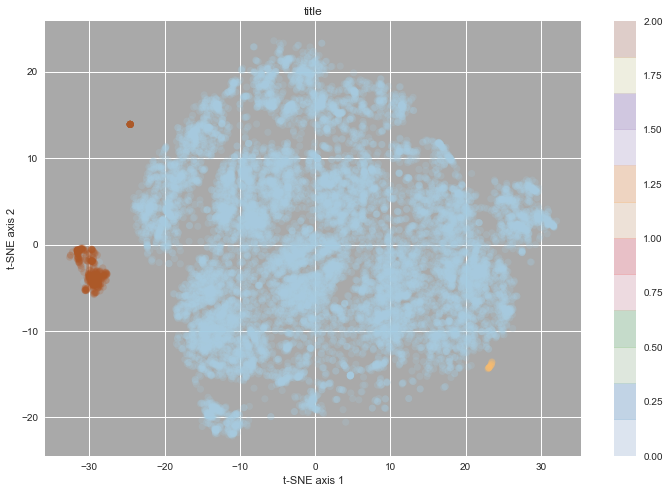

n_clusters =  4


array([1, 0, 2, ..., 0, 0, 0], dtype=int32)

silhouette =  0.189298473537
n_clusters = 4


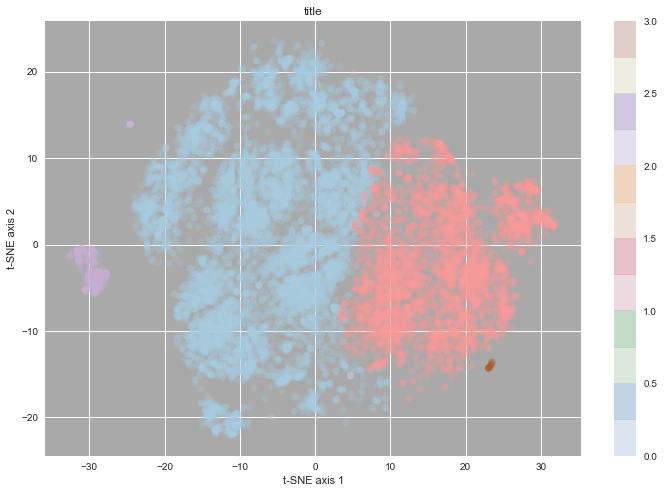

n_clusters =  5


array([3, 0, 4, ..., 0, 0, 4], dtype=int32)

silhouette =  0.328783510333
n_clusters = 5


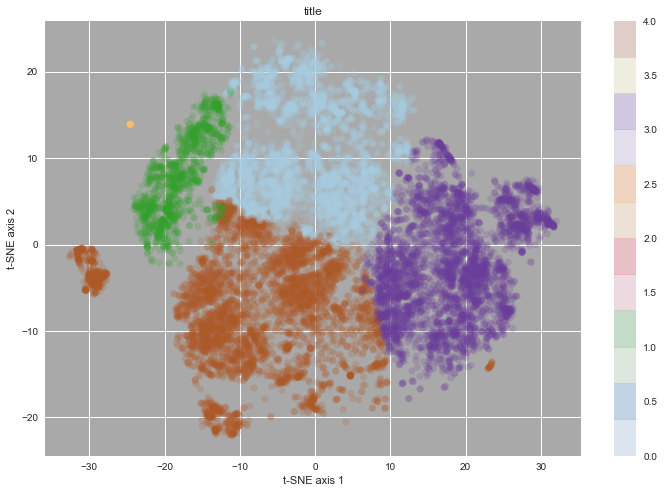

n_clusters =  6


array([4, 0, 4, ..., 0, 0, 4], dtype=int32)

silhouette =  0.229545823144
n_clusters = 6


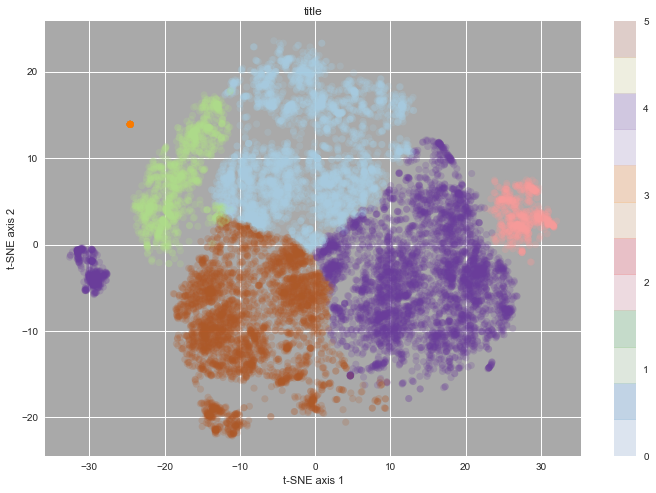

n_clusters =  7


array([1, 1, 1, ..., 1, 1, 4], dtype=int32)

silhouette =  0.209676964196
n_clusters = 7


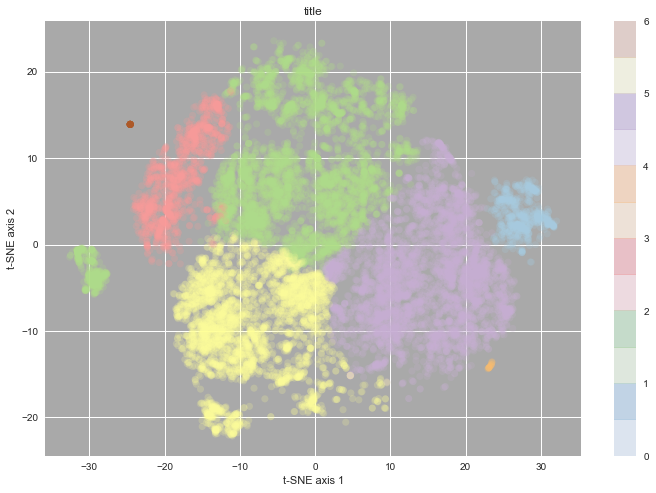

n_clusters =  8


array([7, 7, 4, ..., 7, 7, 6], dtype=int32)

silhouette =  0.269881222573
n_clusters = 8


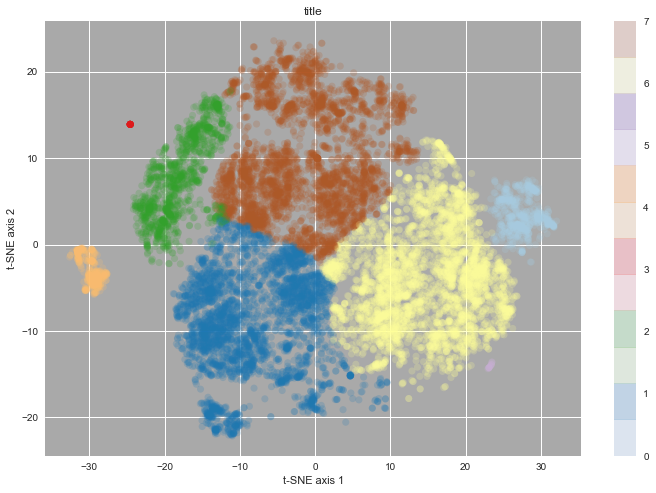

n_clusters =  9


array([2, 7, 3, ..., 2, 7, 2], dtype=int32)

silhouette =  0.260751450623
n_clusters = 9


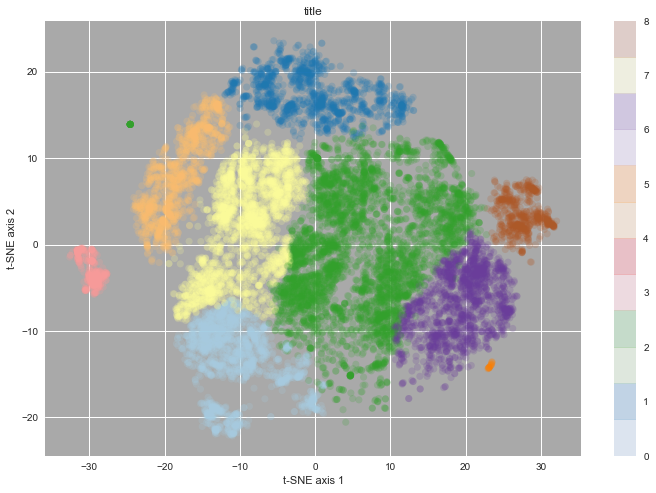

In [47]:
# ... spectraclustering on the t-sne vectors

X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']


from sklearn.cluster import SpectralClustering

# If a string, this may be one of 
#  ‘nearest_neighbors’, ‘precomputed’, ‘rbf’ 
#  or one of the kernels supported by sklearn.metrics.pairwise_kernels

for n_clstr in range(2, 10):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clstr)

    spc = SpectralClustering(n_clusters = n_clstr,
                             affinity = 'nearest_neighbors')
    spc_labels = spc.fit_predict(X_tsne) 
    spc_labels
    spc_silhouette = metrics.silhouette_score(X_tsne,
                                                 spc_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", spc_silhouette)
    
    toc =  time.clock()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {
    'model_name' : 'spc - features',
    'n_clusters' : n_clstr,
    'inertia': 0,
    'silhouette': spc_silhouette, 
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    spc_tbl = spc_tbl.append(df_tbl)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    X_tsne_values = X_tsne.values;
    _ = plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1],
                c = spc_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.colorbar();
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    title = print('n_clusters =', n_clstr);
    _ = plt.title('title')
    _ = plt.grid(True);

    _ = plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - 
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-



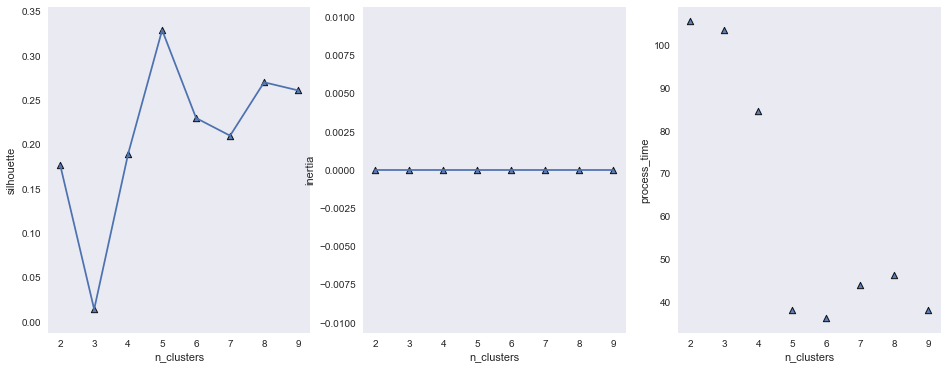

In [48]:

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot metrics across models for comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

plt.figure(figsize=(16, 6));

# ... silhouette values

plt.subplot(131);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(spc_tbl['n_clusters'],
         spc_tbl['silhouette'])

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
plt.grid();

# ... inertia values

plt.subplot(132);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['inertia'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(spc_tbl['n_clusters'],
         spc_tbl['inertia'])

plt.xlabel('n_clusters'), plt.ylabel('inertia');
plt.grid();

# ... process time

plt.subplot(133);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['process_time'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

#plt.plot(spc_tbl['n_clusters'],
#         spc_tbl['process_time'])

plt.xlabel('n_clusters'), plt.ylabel('process_time');
plt.grid();


plt.show();


### - choose spectral clustering with preferred number of clusters  


In [52]:

n_clusters_chosen = 5

for n_clstr in range(n_clusters_chosen, n_clusters_chosen+1):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clstr)

    spc = SpectralClustering(n_clusters = n_clstr,
                             affinity = 'nearest_neighbors')
    spc_labels = spc.fit_predict(X_tsne) 
    spc_labels
    spc_silhouette = metrics.silhouette_score(X_tsne,
                                                 spc_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", spc_silhouette)
    
    toc =  time.clock()



n_clusters =  5


/home/mcdevitt/anaconda3/lib/python3.6/site-packages/sklearn/manifold/spectral_embedding_.py:234: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


array([1, 0, 3, ..., 0, 0, 2], dtype=int32)

silhouette =  0.385570354853


In [50]:

X_all_together = copy.deepcopy(df_join)

len(X_all_together)

X_all_together['spc_labels'] = spc_labels

X_all_together.describe().T


13875

,count,mean,std,min,25%,50%,75%,max
x-tsne,13875.0,0.410117,14.157297,-32.599712,-10.773357,-0.665518,11.126032,32.072052
y-tsne,13875.0,0.040092,9.436279,-22.147314,-6.963444,-0.534287,6.482005,23.578930
sample_index,13875.0,20058.394739,11400.211047,0.000000,10224.000000,20189.000000,29834.500000,39642.000000
n_tokens_title,13875.0,-0.002783,0.997158,-3.972899,-0.661657,-0.188622,0.757447,4.068690
num_keywords,13875.0,-0.011052,0.997482,-3.260042,-0.641015,-0.117210,0.930401,1.454206
data_channel_is_lifestyle,13875.0,0.050739,0.219472,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_entertainment,13875.0,0.178739,0.383147,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_socmed,13875.0,0.057658,0.233103,0.000000,0.000000,0.000000,0.000000,1.000000
kw_avg_max,13875.0,0.021806,0.998054,-1.911764,-0.621457,-0.091469,0.551779,4.335148
is_weekend,13875.0,0.130450,0.336810,0.000000,0.000000,0.000000,0.000000,1.000000


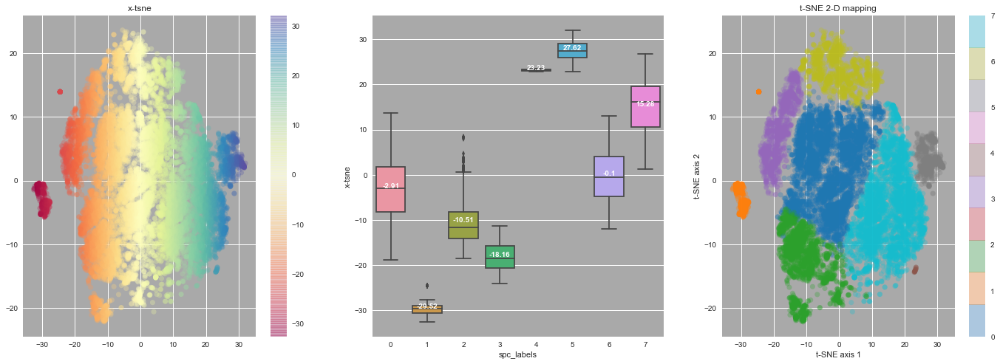

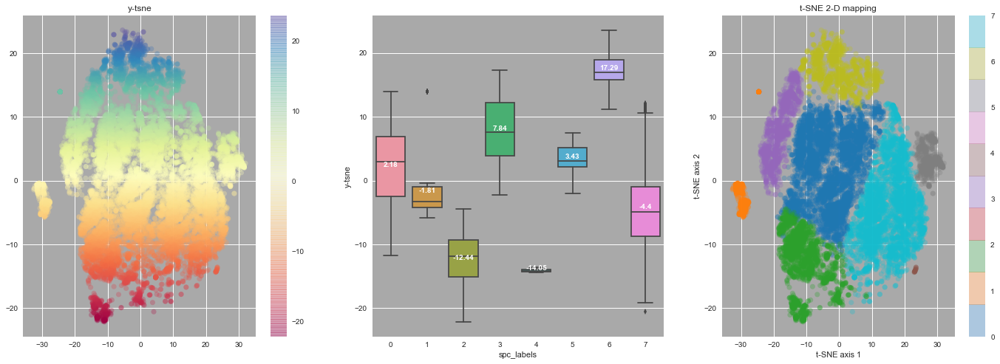

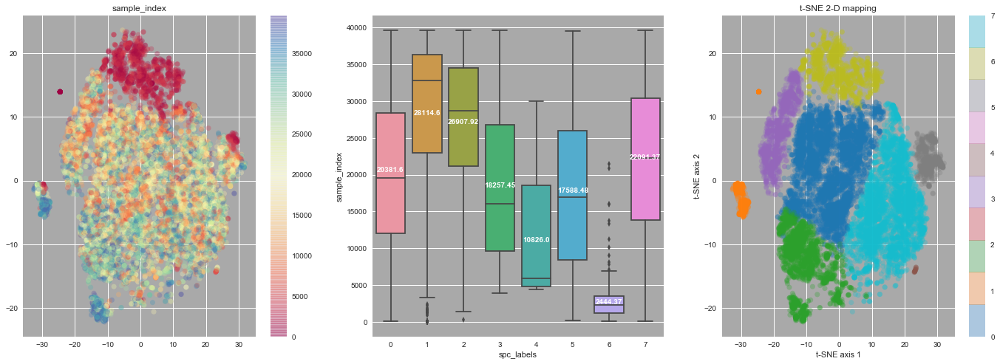

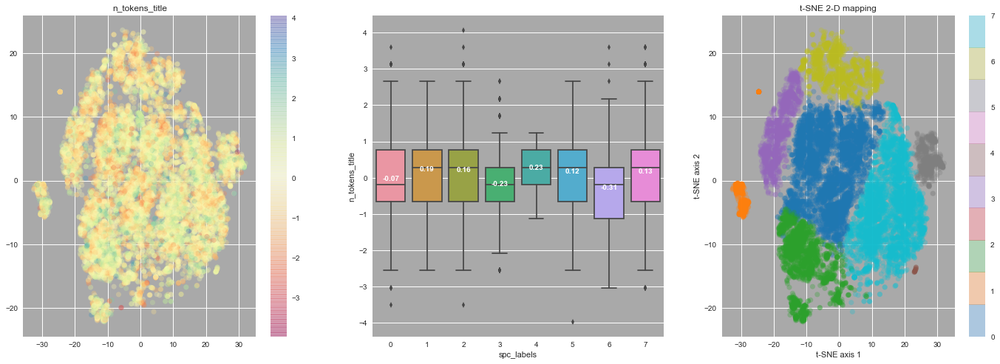

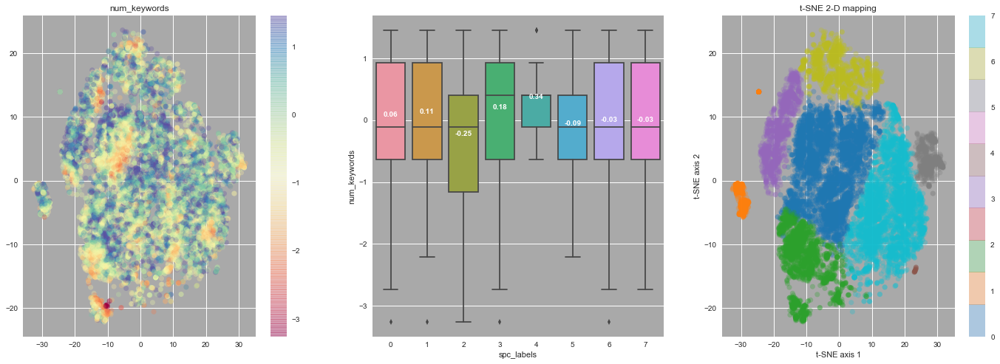

...

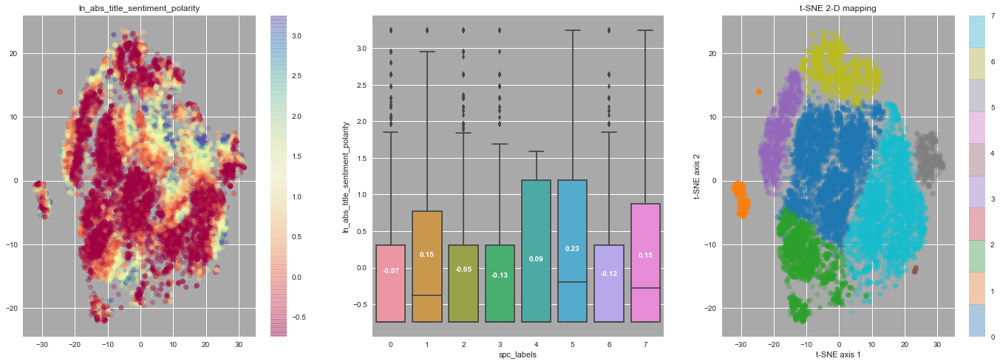

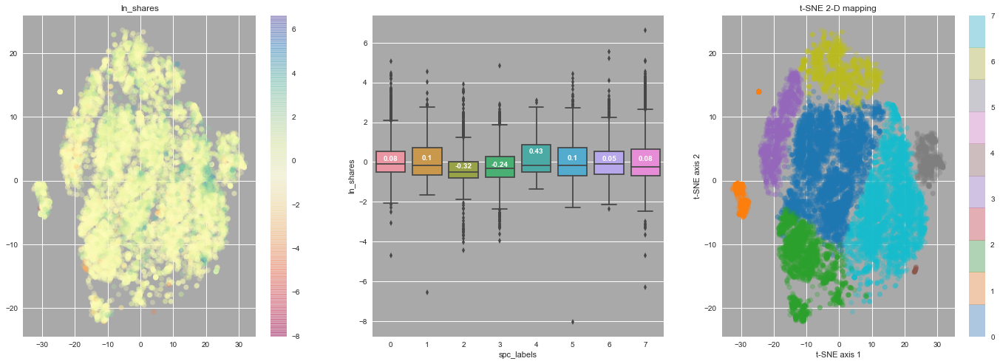

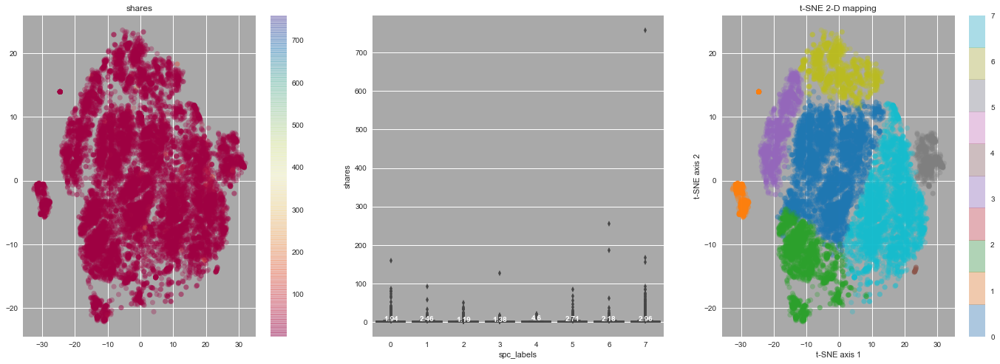

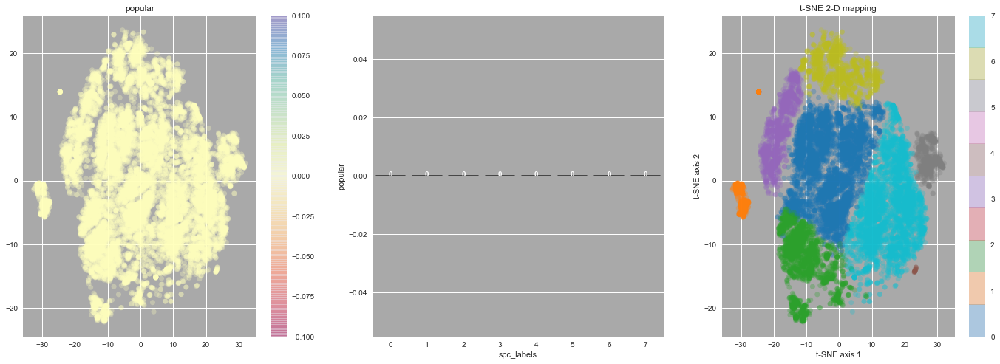

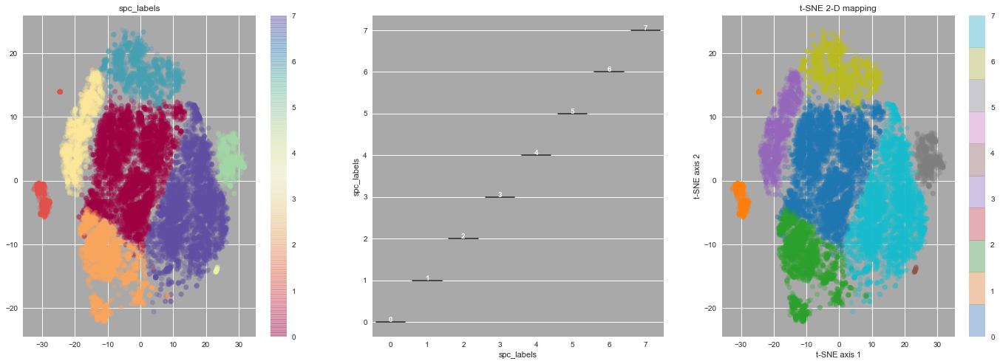

In [51]:
# boxplot across clusters for each feature ...
import seaborn as sns


col_names = X_all_together.columns.values.tolist()

for col in col_names :
    
    _ = plt.figure(figsize=(24, 8));
    
# ... feature distribution color map 

    _ = plt.subplot(131, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = X_all_together[col],
                 cmap = plt.cm.Spectral,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.colorbar()
    _ = plt.title(col)
    
# ... feature boxplots

    _ = plt.subplot(132, facecolor = 'darkgrey');
    ax = sns.boxplot(x = "spc_labels", y = col, data = X_all_together);
    
    average_values = X_all_together.groupby(['spc_labels'])[col].mean().values
    average_labels = [str(np.round(s, 2)) for s in average_values]

    pos = range(len(average_values))
    for tick, label in zip(pos, ax.get_xticklabels()):
        
        _ = ax.text(pos[tick], average_values[tick], average_labels[tick], 
                horizontalalignment = 'center', size = 'small', color = 'w', weight = 'semibold')


# ... cluster color map
    
    _ = plt.subplot(133, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = spc_labels,
                 cmap = plt.cm.tab10,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.colorbar()
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    _ = plt.title('t-SNE 2-D mapping')
 
    plt.show();
    

<a href='#toc'> Table of Contents</a>

<a name='end_of_file'></a>
<font color="blue" size=3>  end of file